In [8]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib
import platform
from PIL import Image
!pip install opencv-contrib-python
import cv2

In [9]:
# Torku
torku = Image.open('images/products/torku.jpg')
torku_raf = Image.open('images/shelves/torku_raf.jpg')
torku_gray = cv2.imread('images/products/torku.jpg', cv2.COLOR_BGR2GRAY)
torku_raf_gray = cv2.imread('images/shelves/torku_raf.jpg', cv2.COLOR_BGR2GRAY)

# STEP 1
# FEATURE DETECTION WITH SIFT
# sif initilazation
sift = cv2.xfeatures2d.SIFT_create()
# for product
kp_product, des_product = sift.detectAndCompute(torku_gray, None) # features and descriptors
kp_torku = cv2.drawKeypoints(torku_gray, kp_product, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# for shelve
kp_shelve, des_shelve = sift.detectAndCompute(torku_raf_gray, None) # features and descriptors
kp_torku_raf = cv2.drawKeypoints(torku_raf_gray, kp_shelve, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# Plot
cv2.imshow('Torku SIFT', kp_torku)
cv2.waitKey()
cv2.imshow('Torku Shelve SIFT', kp_torku_raf)
cv2.waitKey()

# STEP 2
# Fast Library for Approximate Nearest Neighbors based Matching (FLANN)
flann_index = 1
index_params = dict(algorithm = flann_index, trees = 5)
search_params = dict(checks = 50)
flann_matches = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann_matches.knnMatch(des_product,des_shelve,k=2)

# STEP 3
# All matches
all_matches = []
for m,n in matches:
    all_matches.append(m)

torku_all_matched = cv2.drawMatches(torku_gray, kp_product, torku_raf_gray, kp_shelve, all_matches, cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.imshow('torku_all_matched', torku_all_matched)
cv2.waitKey()

# Selection of good matches by using Lowe's ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.67*n.distance:
        good_matches.append(m)
    
# STEP 4    
# Matched features are being drawn and only inliers are drawn
torku_matched = cv2.drawMatches(torku_gray, kp_product, torku_raf_gray, kp_shelve, good_matches, cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2.imshow('Feature matched',torku_matched)
cv2.waitKey()

# STEP 5
# Homographical transform by using 3x3 homography matrix
src_pts = np.float32([ kp_product[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_shelve[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 4.0)
mask_of_matches = mask.ravel().tolist()
h,w,d = torku_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)
# In addition to feaure matchings(inliers), founded product is homographically enclosed 
homography = cv2.polylines(torku_raf_gray,[np.int32(dst)], True, (0,255,250), 4, cv2.LINE_AA) # draw lines around product in the shelve
torku_homographically_matched = cv2.drawMatches(torku_gray, kp_product, homography, kp_shelve, good_matches, None,flags=2)
cv2.imshow('Feature homograpphically matched',torku_homographically_matched)
cv2.waitKey()

# STEP 6
# Here, I printed the number of key point in the product and number of inliers (matched features) at the end 
print("Total number of all matches = ", len(all_matches))
print("Total number of good matches = ", len(good_matches))


Total number of all matches =  1058
Total number of good matches =  40


In [11]:
# Sut
sut = Image.open('images/products/sut.jpg')
sut_raf = Image.open('images/shelves/sut_raf.jpg')
sut_gray = cv2.imread('images/products/sut.jpg', cv2.COLOR_BGR2GRAY)
sut_raf_gray = cv2.imread('images/shelves/sut_raf.jpg', cv2.COLOR_BGR2GRAY)

# STEP 1
# FEATURE DETECTION WITH SIFT
# sif initilazation
sift = cv2.xfeatures2d.SIFT_create()
# for product
kp_product, des_product = sift.detectAndCompute(sut_gray, None) # features and descriptors
kp_sut = cv2.drawKeypoints(sut_gray, kp_product, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# for shelve
kp_shelve, des_shelve = sift.detectAndCompute(sut_raf_gray, None) # features and descriptors
kp_sut_raf = cv2.drawKeypoints(sut_raf_gray, kp_shelve, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# Plot
cv2.imshow('Sut SIFT', kp_sut)
cv2.waitKey()
cv2.imshow('Sut Shelve SIFT', kp_sut_raf)
cv2.waitKey()

# STEP 2
# Fast Library for Approximate Nearest Neighbors based Matching (FLANN)
flann_index = 1
index_params = dict(algorithm = flann_index, trees = 5)
search_params = dict(checks = 50)
flann_matches = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann_matches.knnMatch(des_product,des_shelve,k=2)

# STEP 3
# All matches
all_matches = []
for m,n in matches:
    all_matches.append(m)

sut_all_matched = cv2.drawMatches(sut_gray, kp_product, sut_raf_gray, kp_shelve, all_matches, cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.imshow('sut_all_matched', sut_all_matched)
cv2.waitKey()

# Selection of good matches by using Lowe's ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.67*n.distance:
        good_matches.append(m)
    
# STEP 4    
# Matched features are being drawn and only inliers are drawn
sut_matched = cv2.drawMatches(sut_gray, kp_product, sut_raf_gray, kp_shelve, good_matches, cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2.imshow('Feature matched',sut_matched)
cv2.waitKey()

# STEP 5
# Homographical transform by using 3x3 homography matrix
src_pts = np.float32([ kp_product[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_shelve[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 4.0)
mask_of_matches = mask.ravel().tolist()
h,w,d = sut_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)
# In addition to feaure matchings(inliers), founded product is homographically enclosed 
homography = cv2.polylines(sut_raf_gray,[np.int32(dst)], True, (0,255,250), 4, cv2.LINE_AA) # draw lines around product in the shelve
sut_homographically_matched = cv2.drawMatches(sut_gray, kp_product, homography, kp_shelve, good_matches, None,flags=2)
cv2.imshow('Feature homograpphically matched',sut_homographically_matched)
cv2.waitKey()

# STEP 6
# Here, I printed the number of key point in the product and number of inliers (matched features) at the end 
print("Total number of all matches = ", len(all_matches))
print("Total number of good matches = ", len(good_matches))

Total number of all matches =  602
Total number of good matches =  21


In [12]:
# Pepsi
pepsi = Image.open('images/products/pepsi.jpg')
pepsi_raf = Image.open('images/shelves/pepsi_raf.jpg')
pepsi_gray = cv2.imread('images/products/pepsi.jpg', cv2.COLOR_BGR2GRAY)
pepsi_raf_gray = cv2.imread('images/shelves/pepsi_raf.jpg', cv2.COLOR_BGR2GRAY)

# STEP 1
# FEATURE DETECTION WITH SIFT
# sif initilazation
sift = cv2.xfeatures2d.SIFT_create()
# for product
kp_product, des_product = sift.detectAndCompute(pepsi_gray, None) # features and descriptors
kp_pepsi = cv2.drawKeypoints(pepsi_gray, kp_product, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# for shelve
kp_shelve, des_shelve = sift.detectAndCompute(pepsi_raf_gray, None) # features and descriptors
kp_pepsi_raf = cv2.drawKeypoints(pepsi_raf_gray, kp_shelve, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# Plot
cv2.imshow('pepsi SIFT', kp_pepsi)
cv2.waitKey()
cv2.imshow('pepsi Shelve SIFT', kp_pepsi_raf)
cv2.waitKey()

# STEP 2
# Fast Library for Approximate Nearest Neighbors based Matching (FLANN)
flann_index = 1
index_params = dict(algorithm = flann_index, trees = 5)
search_params = dict(checks = 50)
flann_matches = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann_matches.knnMatch(des_product,des_shelve,k=2)

# STEP 3
# All matches
all_matches = []
for m,n in matches:
    all_matches.append(m)

pepsi_all_matched = cv2.drawMatches(pepsi_gray, kp_product, pepsi_raf_gray, kp_shelve, all_matches, cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.imshow('pepsi_all_matched', pepsi_all_matched)
cv2.waitKey()

# Selection of good matches by using Lowe's ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.71*n.distance:
        good_matches.append(m)
    
# STEP 4    
# Matched features are being drawn and only inliers are drawn
pepsi_matched = cv2.drawMatches(pepsi_gray, kp_product, pepsi_raf_gray, kp_shelve, good_matches, cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2.imshow('Feature matched',pepsi_matched)
cv2.waitKey()

# STEP 5
# Here I add if block because there is only 1 inlier, so homographical transform couldn't be done.
if(len(good_matches)>5):
    # Homographical transform by using 3x3 homography matrix
    src_pts = np.float32([ kp_product[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp_shelve[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    mask_of_matches = mask.ravel().tolist()
    h,w,d = pepsi_gray.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)
    # In addition to feaure matchings(inliers), founded product is homographically enclosed 
    homography = cv2.polylines(pepsi_raf_gray,[np.int32(dst)], True, (50,10,200), 4, cv2.LINE_AA) # draw lines around product in the shelve
    pepsi_homographically_matched = cv2.drawMatches(pepsi_gray, kp_product, homography, kp_shelve, good_matches, None,flags=2)
    cv2.imshow('Feature homograpphically matched',pepsi_homographically_matched)
    cv2.waitKey()
    

# STEP 6
# Here, I printed the number of key point in the product and number of inliers (matched features) at the end 
print("Total number of all matches = ", len(all_matches))
print("Total number of good matches = ", len(good_matches))



Total number of all matches =  114
Total number of good matches =  1


In [20]:
# Patos
patos = Image.open('images/products/patos.jpg')
patos_raf = Image.open('images/shelves/patos_raf.jpg')
patos_gray = cv2.imread('images/products/patos.jpg', cv2.COLOR_BGR2GRAY)
patos_raf_gray = cv2.imread('images/shelves/patos_raf.jpg', cv2.COLOR_BGR2GRAY)

# STEP 1
# FEATURE DETECTION WITH SIFT
# sif initilazation
sift = cv2.xfeatures2d.SIFT_create()
# for product
kp_product, des_product = sift.detectAndCompute(patos_gray, None) # features and descriptors
kp_patos = cv2.drawKeypoints(patos_gray, kp_product, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# for shelve
kp_shelve, des_shelve = sift.detectAndCompute(patos_raf_gray, None) # features and descriptors
kp_patos_raf = cv2.drawKeypoints(patos_raf_gray, kp_shelve, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# Plot
cv2.imshow('Patos SIFT', kp_patos)
cv2.waitKey()
cv2.imshow('Patos Shelve SIFT', kp_patos_raf)
cv2.waitKey()

# STEP 2
# Fast Library for Approximate Nearest Neighbors based Matching (FLANN)
flann_index = 1
index_params = dict(algorithm = flann_index, trees = 5)
search_params = dict(checks = 50)
flann_matches = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann_matches.knnMatch(des_product,des_shelve,k=2)

# STEP 3
# All matches
all_matches = []
for m,n in matches:
    all_matches.append(m)

patos_all_matched = cv2.drawMatches(patos_gray, kp_product, patos_raf_gray, kp_shelve, all_matches, cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.imshow('patos_all_matched', patos_all_matched)
cv2.waitKey()

# Selection of good matches by using Lowe's ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.65*n.distance:
        good_matches.append(m)
    
# STEP 4    
# Matched features are being drawn and only inliers are drawn
patos_matched = cv2.drawMatches(patos_gray, kp_product, patos_raf_gray, kp_shelve, good_matches, cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2.imshow('Feature matched',patos_matched)
cv2.waitKey()

# STEP 5
# Homographical transform by using 3x3 homography matrix
src_pts = np.float32([ kp_product[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_shelve[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 4.0)
mask_of_matches = mask.ravel().tolist()
h,w,d = patos_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)
# In addition to feaure matchings(inliers), founded product is homographically enclosed 
homography = cv2.polylines(patos_raf_gray,[np.int32(dst)], True, (0,255,250), 4, cv2.LINE_AA) # draw lines around product in the shelve
patos_homographically_matched = cv2.drawMatches(patos_gray, kp_product, homography, kp_shelve, good_matches, None,flags=2)
cv2.imshow('Feature homograpphically matched',patos_homographically_matched)
cv2.waitKey()

# STEP 6
# Here, I printed the number of key point in the product and number of inliers (matched features) at the end 
print("Total number of all matches = ", len(all_matches))
print("Total number of good matches = ", len(good_matches))



Total number of all matches =  736
Total number of good matches =  57


In [26]:
# Lipton
lipton = Image.open('images/products/lipton.jpg')
lipton_raf = Image.open('images/shelves/lipton_raf.jpg')
lipton_gray = cv2.imread('images/products/lipton.jpg', cv2.COLOR_BGR2GRAY)
lipton_raf_gray = cv2.imread('images/shelves/lipton_raf.jpg', cv2.COLOR_BGR2GRAY)

# STEP 1
# FEATURE DETECTION WITH SIFT
# sif initilazation
sift = cv2.xfeatures2d.SIFT_create()
# for product
kp_product, des_product = sift.detectAndCompute(lipton_gray, None) # features and descriptors
kp_lipton = cv2.drawKeypoints(lipton_gray, kp_product, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# for shelve
kp_shelve, des_shelve = sift.detectAndCompute(lipton_raf_gray, None) # features and descriptors
kp_lipton_raf = cv2.drawKeypoints(lipton_raf_gray, kp_shelve, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# Plot
cv2.imshow('Lipton SIFT', kp_lipton)
cv2.waitKey()
cv2.imshow('Lipton Shelve SIFT', kp_lipton_raf)
cv2.waitKey()

# STEP 2
# Fast Library for Approximate Nearest Neighbors based Matching (FLANN)
flann_index = 1
index_params = dict(algorithm = flann_index, trees = 5)
search_params = dict(checks = 50)
flann_matches = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann_matches.knnMatch(des_product,des_shelve,k=2)

# STEP 3
# All matches
all_matches = []
for m,n in matches:
    all_matches.append(m)

lipton_all_matched = cv2.drawMatches(lipton_gray, kp_product, lipton_raf_gray, kp_shelve, all_matches, cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.imshow('lipton_all_matched', lipton_all_matched)
cv2.waitKey()

# Selection of good matches by using Lowe's ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.67*n.distance:
        good_matches.append(m)
    
# STEP 4    
# Matched features are being drawn and only inliers are drawn
lipton_matched = cv2.drawMatches(lipton_gray, kp_product, lipton_raf_gray, kp_shelve, good_matches, cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2.imshow('Feature matched',lipton_matched)
cv2.waitKey()

# STEP 5
# Homographical transform by using 3x3 homography matrix
src_pts = np.float32([ kp_product[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_shelve[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 4.0)
mask_of_matches = mask.ravel().tolist()
h,w,d = lipton_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)
# In addition to feaure matchings(inliers), founded product is homographically enclosed 
homography = cv2.polylines(lipton_raf_gray,[np.int32(dst)], True, (0,255,250), 4, cv2.LINE_AA) # draw lines around product in the shelve
lipton_homographically_matched = cv2.drawMatches(lipton_gray, kp_product, homography, kp_shelve, good_matches, None,flags=2)
cv2.imshow('Feature homograpphically matched',lipton_homographically_matched)
cv2.waitKey()

# STEP 6
# Here, I printed the number of key point in the product and number of inliers (matched features) at the end 
print("Total number of all matches = ", len(all_matches))
print("Total number of good matches = ", len(good_matches))



Total number of all matches =  316
Total number of good matches =  25


In [27]:
# Hellmann
hellmann = Image.open('images/products/hellmann.jpg')
hellmann_raf = Image.open('images/shelves/hellmann_raf.jpg')
hellmann_gray = cv2.imread('images/products/hellmann.jpg', cv2.COLOR_BGR2GRAY)
hellmann_raf_gray= cv2.imread('images/shelves/hellmann_raf.jpg', cv2.COLOR_BGR2GRAY)

# STEP 1
# FEATURE DETECTION WITH SIFT
# sif initilazation
sift = cv2.xfeatures2d.SIFT_create()
# for product
kp_product, des_product = sift.detectAndCompute(hellmann_gray, None) # features and descriptors
kp_hellmann = cv2.drawKeypoints(hellmann_gray, kp_product, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# for shelve
kp_shelve, des_shelve = sift.detectAndCompute(hellmann_raf_gray, None) # features and descriptors
kp_hellmann_raf = cv2.drawKeypoints(hellmann_raf_gray, kp_shelve, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# Plot
cv2.imshow('Hellmann SIFT', kp_hellmann)
cv2.waitKey()
cv2.imshow('Hellmann Shelve SIFT', kp_hellmann_raf)
cv2.waitKey()

# STEP 2
# Fast Library for Approximate Nearest Neighbors based Matching (FLANN)
flann_index = 1
index_params = dict(algorithm = flann_index, trees = 5)
search_params = dict(checks = 50)
flann_matches = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann_matches.knnMatch(des_product,des_shelve,k=2)

# STEP 3
# All matches
all_matches = []
for m,n in matches:
    all_matches.append(m)

hellmann_all_matched = cv2.drawMatches(hellmann_gray, kp_product, hellmann_raf_gray, kp_shelve, all_matches, cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.imshow('hellmann_all_matched', hellmann_all_matched)
cv2.waitKey()

# Selection of good matches by using Lowe's ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good_matches.append(m)
    
# STEP 4    
# Matched features are being drawn and only inliers are drawn
hellmann_matched = cv2.drawMatches(hellmann_gray, kp_product, hellmann_raf_gray, kp_shelve, good_matches, cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2.imshow('Feature matched',hellmann_matched)
cv2.waitKey()

# STEP 5
# Here I add if block because there is only 1 inlier, so homographical transform couldn't be done.
if(len(good_matches)>5):
    # Homographical transform by using 3x3 homography matrix
    src_pts = np.float32([ kp_product[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp_shelve[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    mask_of_matches = mask.ravel().tolist()
    h,w,d = hellmann_gray.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)
    # In addition to feaure matchings(inliers), founded product is homographically enclosed 
    homography = cv2.polylines(hellmann_raf_gray,[np.int32(dst)], True, (50,10,200), 4, cv2.LINE_AA) # draw lines around product in the shelve
    hellmann_homographically_matched = cv2.drawMatches(hellmann_gray, kp_product, homography, kp_shelve, good_matches, None,flags=2)
    cv2.imshow('Feature homograpphically matched', hellmann_homographically_matched)
    cv2.waitKey()

# STEP 6
# Here, I printed the number of key point in the product and number of inliers (matched features) at the end 
print("Total number of all matches = ", len(all_matches))
print("Total number of good matches = ", len(good_matches))



Total number of all matches =  263
Total number of good matches =  3


In [30]:
# Fairy
fairy = Image.open('images/products/fairy.jpg')
fairy_raf = Image.open('images/shelves/fairy_raf.jpg')
fairy_gray= cv2.imread('images/products/fairy.jpg', cv2.COLOR_BGR2GRAY)
fairy_raf_gray= cv2.imread('images/shelves/fairy_raf.jpg', cv2.COLOR_BGR2GRAY)

# STEP 1
# FEATURE DETECTION WITH SIFT
# sif initilazation
sift = cv2.xfeatures2d.SIFT_create()
# for product
kp_product, des_product = sift.detectAndCompute(fairy_gray, None) # features and descriptors
kp_fairy = cv2.drawKeypoints(fairy_gray, kp_product, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# for shelve
kp_shelve, des_shelve = sift.detectAndCompute(fairy_raf_gray, None) # features and descriptors
kp_fairy_raf = cv2.drawKeypoints(fairy_raf_gray, kp_shelve, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# Plot
cv2.imshow('Fairy SIFT', kp_fairy)
cv2.waitKey()
cv2.imshow('Fairy Shelve SIFT', kp_fairy_raf)
cv2.waitKey()

# STEP 2
# Fast Library for Approximate Nearest Neighbors based Matching (FLANN)
flann_index = 1
index_params = dict(algorithm = flann_index, trees = 5)
search_params = dict(checks = 50)
flann_matches = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann_matches.knnMatch(des_product,des_shelve,k=2)

# STEP 3
# All matches
all_matches = []
for m,n in matches:
    all_matches.append(m)

fairy_all_matched = cv2.drawMatches(fairy_gray, kp_product, fairy_raf_gray, kp_shelve, all_matches, cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.imshow('fairy_all_matched', fairy_all_matched)
cv2.waitKey()

# Selection of good matches by using Lowe's ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.665*n.distance:
        good_matches.append(m)
    
# STEP 4    
# Matched features are being drawn and only inliers are drawn
fairy_matched = cv2.drawMatches(fairy_gray, kp_product, fairy_raf_gray, kp_shelve, good_matches, cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2.imshow('Feature matched', fairy_matched)
cv2.waitKey()

# STEP 5
# Homographical transform by using 3x3 homography matrix
src_pts = np.float32([ kp_product[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_shelve[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 4.0)
mask_of_matches = mask.ravel().tolist()
h,w,d = fairy_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)
# In addition to feaure matchings(inliers), founded product is homographically enclosed 
homography = cv2.polylines(fairy_raf_gray,[np.int32(dst)], True, (0,255,250), 4, cv2.LINE_AA) # draw lines around product in the shelve
fairy_homographically_matched = cv2.drawMatches(fairy_gray, kp_product, homography, kp_shelve, good_matches, None,flags=2)
cv2.imshow('Feature homograpphically matched',fairy_homographically_matched)
cv2.waitKey()

# STEP 6
# Here, I printed the number of key point in the product and number of inliers (matched features) at the end 
print("Total number of all matches = ", len(all_matches))
print("Total number of good matches = ", len(good_matches))



Total number of all matches =  639
Total number of good matches =  32


In [31]:
# Doganay
doganay = Image.open('images/products/doganay.jpg')
doganay_raf = Image.open('images/shelves/doganay_raf.jpg')
doganay_gray= cv2.imread('images/products/doganay.jpg', cv2.COLOR_BGR2GRAY)
doganay_raf_gray= cv2.imread('images/shelves/doganay_raf.jpg', cv2.COLOR_BGR2GRAY)

# STEP 1
# FEATURE DETECTION WITH SIFT
# sif initilazation
sift = cv2.xfeatures2d.SIFT_create()
# for product
kp_product, des_product = sift.detectAndCompute(doganay_gray, None) # features and descriptors
kp_doganay = cv2.drawKeypoints(doganay_gray, kp_product, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# for shelve
kp_shelve, des_shelve = sift.detectAndCompute(doganay_raf_gray, None) # features and descriptors
kp_doganay_raf = cv2.drawKeypoints(doganay_raf_gray, kp_shelve, None,                    
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# Plot
cv2.imshow('Doganay SIFT', kp_doganay)
cv2.waitKey()
cv2.imshow('Doganay Shelve SIFT', kp_doganay_raf)
cv2.waitKey()

# STEP 2
# Fast Library for Approximate Nearest Neighbors based Matching (FLANN)
flann_index = 1
index_params = dict(algorithm = flann_index, trees = 5)
search_params = dict(checks = 50)
flann_matches = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann_matches.knnMatch(des_product,des_shelve,k=2)

# STEP 3
# All matches
all_matches = []
for m,n in matches:
    all_matches.append(m)

doganay_all_matched = cv2.drawMatches(doganay_gray, kp_product, doganay_raf_gray, kp_shelve, all_matches, cv2.DrawMatchesFlags_DRAW_RICH_KEYPOINTS)
cv2.imshow('doganay_all_matched', doganay_all_matched)
cv2.waitKey()

# Selection of good matches by using Lowe's ratio test
good_matches = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good_matches.append(m)
    
# STEP 4    
# Matched features are being drawn and only inliers are drawn
doganay_matched = cv2.drawMatches(doganay_gray, kp_product, doganay_raf_gray, kp_shelve, good_matches, cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
cv2.imshow('Feature matched', doganay_matched)
cv2.waitKey()

# STEP 5
# Homographical transform by using 3x3 homography matrix
src_pts = np.float32([ kp_product[m.queryIdx].pt for m in good_matches ]).reshape(-1,1,2)
dst_pts = np.float32([ kp_shelve[m.trainIdx].pt for m in good_matches ]).reshape(-1,1,2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 4.5)
mask_of_matches = mask.ravel().tolist()
h,w,d = doganay_gray.shape
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)
# In addition to feaure matchings(inliers), founded product is homographically enclosed 
homography = cv2.polylines(doganay_raf_gray,[np.int32(dst)], True, (0,255,250), 4, cv2.LINE_AA) # draw lines around product in the shelve
doganay_homographically_matched = cv2.drawMatches(doganay_gray, kp_product, homography, kp_shelve, good_matches, None,flags=2)
cv2.imshow('Feature homograpphically matched',doganay_homographically_matched)
cv2.waitKey()

# STEP 6
# Here, I printed the number of key point in the product and number of inliers (matched features) at the end 
print("Total number of all matches = ", len(all_matches))
print("Total number of good matches = ", len(good_matches))

Total number of all matches =  184
Total number of good matches =  8


Text(0.5, 1.0, 'doganay_homographically_matched')

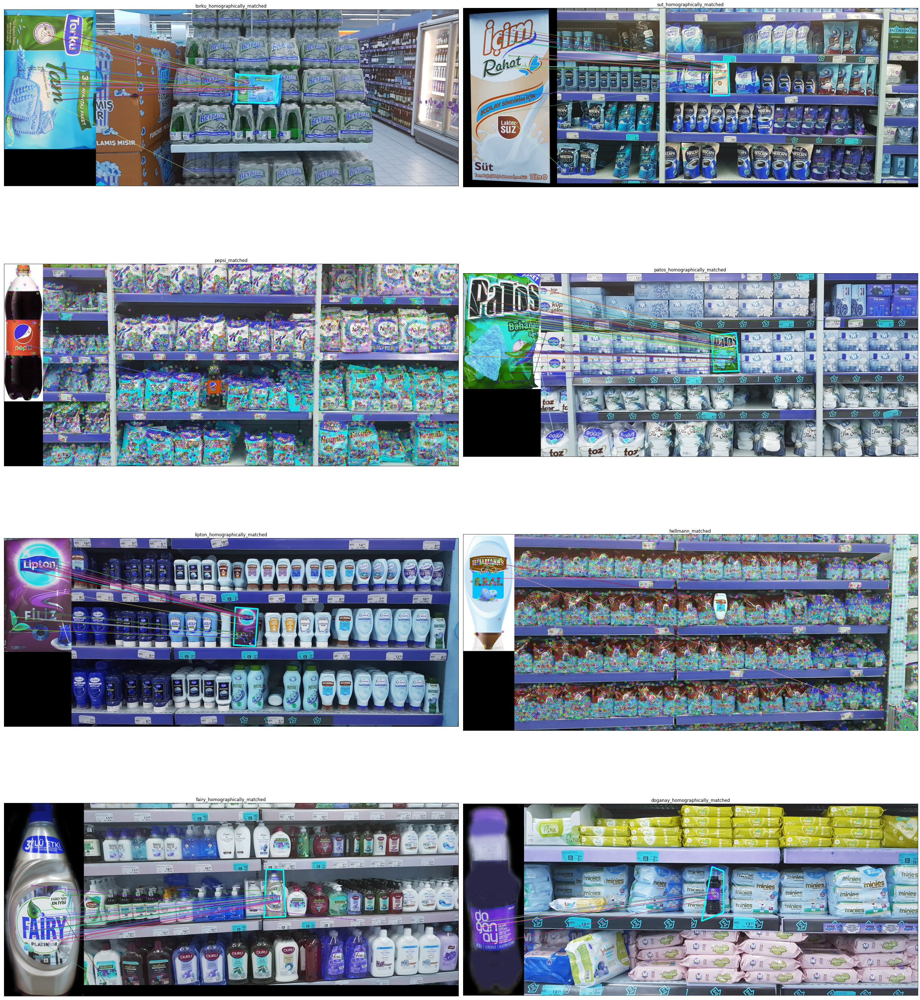

In [33]:
# I plot all the results
fig, axarr =  plt.subplots(4,2,figsize=(50, 50))
plt.setp(axarr, xticks=[], yticks=[])
plt.subplots_adjust(left=0.2, bottom=0.1, right=0.9, top=0.9, wspace=0.01, hspace=0.1)
axarr[0,0].imshow(torku_homographically_matched)
axarr[0,0].set_title('torku_homographically_matched')
axarr[0,1].imshow(sut_homographically_matched)
axarr[0,1].set_title('sut_homographically_matched')
axarr[1,0].imshow(pepsi_matched)
axarr[1,0].set_title('pepsi_matched')
axarr[1,1].imshow(patos_homographically_matched)
axarr[1,1].set_title('patos_homographically_matched')
axarr[2,0].imshow(lipton_homographically_matched)
axarr[2,0].set_title('lipton_homographically_matched')
axarr[2,1].imshow(hellmann_matched)
axarr[2,1].set_title('hellmann_matched')
axarr[3,0].imshow(fairy_homographically_matched)
axarr[3,0].set_title('fairy_homographically_matched')
axarr[3,1].imshow(doganay_homographically_matched)
axarr[3,1].set_title('doganay_homographically_matched')
